In [ ]:
pip install streamlit

In [ ]:
!pip install --quiet transformers==4.5.0

In [ ]:
!pip install -q gradio
!pip install -q git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [ ]:
import numpy as np
import pandas as pd
import streamlit as st
import random

# for reproducibility , to get the same results when evry your run
np.random.seed(2021) 

import re
import string
from collections import Counter

from pprint import pprint

import sys
import os

#Importing the required Dependencies
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import requests
from io import BytesIO

import time
import json
from glob import glob
from PIL import Image
import pickle

In [ ]:
def load_image(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img,channels=3)
    img = tf.image.resize(img,(299,299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    #file_path = "./Pickle"+file_path[11:]
    print(file_path)
    return img,file_path

In [ ]:
image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input,hidden_layer)

2022-01-20 16:42:14.595934: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE=1000
embedding_dim = 256
top_k = 9000
units=512
vocab_size = top_k+1
features_shape = 2048
attention_features_shape = 64

In [ ]:
#Load the numpy files
def map_func(image_name,cap):
  img_tensor = np.load(image_name.decode('utf-8')+'.npy')
  return img_tensor,cap

In [ ]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self,units):
    super(BahdanauAttention,self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V1 = tf.keras.layers.Dense(1)

  def call(self,features,hidden):
    hidden_with_time_axis = tf.expand_dims(hidden,1)
    score = tf.nn.tanh(self.W1(hidden_with_time_axis)+
                       self.W2(features))
    attention_weights = tf.nn.softmax(self.V1(score),axis=1)


    context_vector = attention_weights*features
    context_vector = tf.reduce_sum(context_vector,axis=1)
    return context_vector,attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):
  def __init__(self,embedding_dim):
    super(CNN_Encoder,self).__init__()
    self.fc = tf.keras.layers.Dense(embedding_dim)

  def call(self,x):
    x = self.fc(x)
    x = tf.nn.tanh(x)
    return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self,embedding_dim,units,vocab_size):
    super(RNN_Decoder,self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size,embedding_dim)
    self.GRU = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer = 'glorot_uniform')
    self.drop1 = tf.keras.layers.Dropout(0.4)
    self.batch_norm = tf.keras.layers.BatchNormalization()
    self.fc1 = tf.keras.layers.Dense(512)
    self.fc2 = tf.keras.layers.Dense(vocab_size)
    
    self.attention = BahdanauAttention(self.units)

  def call(self,x,features,hidden):
    context_vector,attention_weights = self.attention(features,hidden)
    x = self.embedding(x)

    x = tf.concat([tf.expand_dims(context_vector,1),x],axis=-1)

    output,state = self.GRU(x)
    x = self.fc1(output)
    x = self.drop1(x)
    x = self.batch_norm(x)
    x = tf.reshape(x, (-1, x.shape[2]))
    x = self.fc2(x)

    return x,state,attention_weights

  def reset_state(self,batch_sz):
    return tf.zeros([batch_sz,self.units])

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim,units,vocab_size)

In [ ]:
#Loss and Optimizer
optimizer=tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True,reduction='none')

def loss_function(real,pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip3 install pickle5
import pickle5 as pickle

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
     |████████████████████████████████| 256 kB 5.3 MB/s 


In [ ]:
with open('/content/drive/MyDrive/newpickles/tokenizer1.pickle', 'rb') as handle:
    tokenizer = pickle.load(handle)

In [ ]:
#Initializing using Random Input
test_x = encoder(np.ones([1,64,2048]))
encoder.load_weights("/content/drive/MyDrive/newpickles/weights1.hdf5")
b = decoder.attention(test_x,decoder.reset_state(BATCH_SIZE))
c = decoder(tf.expand_dims([3]*BATCH_SIZE,1),test_x,decoder.reset_state(BATCH_SIZE))
decoder.load_weights("/content/drive/MyDrive/newpickles/weights2.hdf5")
decoder.attention.load_weights("/content/drive/MyDrive/newpickles/weights3.hdf5")

In [ ]:
def evaluate(image):
    attention_plot = np.zeros([29,64])
    hidden = decoder.reset_state(1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([3],0)
    result = []
    for i in range(29):
        prediction,hidden,attention_weights = decoder(dec_input,features,hidden)
        attention_plot[i] = tf.reshape(attention_weights,(-1,)).numpy()
        predicted_id = tf.random.categorical(prediction,1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])
        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot
        dec_input = tf.expand_dims([predicted_id],0)
  
    attention_plot = attention_plot[:len(result),:]
    return result,attention_plot

In [ ]:
def plot_attention(image,result,attention_plot):
    temp_image = np.array(Image.open(image))
    fig = plt.figure(figsize=(15,15))
    len_result = len(result)
    for i in range(len_result):
        temp_att = np.resize(attention_plot[i],(8,8))
        ax =fig.add_subplot(len_result//2, len_result//2, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att,cmap='gray',alpha=0.6,extent=img.get_extent())

    #plt.tight_layout()
    plt.show()

/root/.keras/datasets/image.jpg
Prediction Caption: <start> big is a children doing stretching a airplane in the station <end>


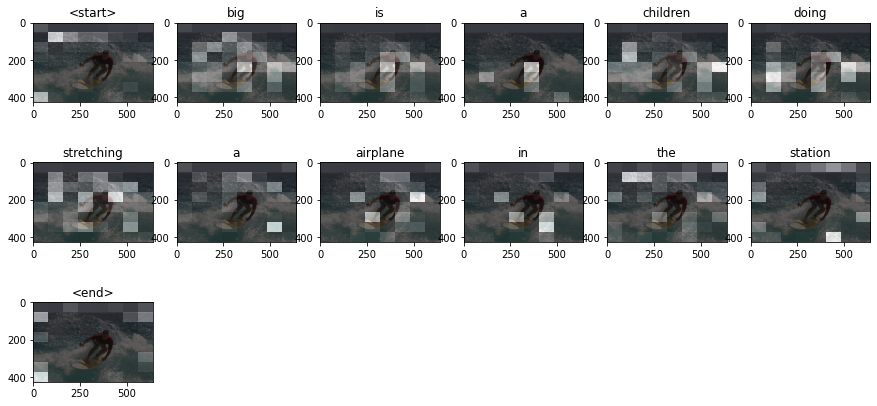

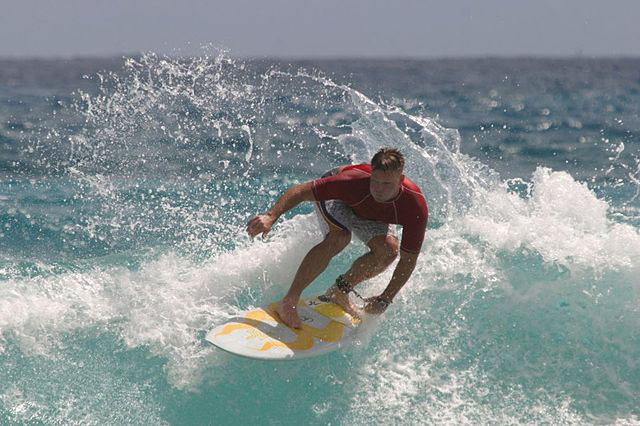

In [ ]:
image_url = 'https://tensorflow.org/images/surf.jpg'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension, origin=image_url)

result, attention_plot = evaluate(image_path)
print('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

In [ ]:
# st.title("Hello World It's Goodread Tags Prediction App !")

# input_quote = ""
# pred_tags = []

# #input_image = st.text_input('Enter Your Image Path Here!')

# #caption_result, plot = evaluate(input_image)
# st.write('### The Predicted Caption Is:')
# #st.write(caption_result)
# #st.write(plot)

# # echo 'web: sh setup.sh && streamlit run app.py' >Procfile

# # echo 'mkdir -p ~/.streamlit/
# # echo "\
# # [server]\n\
# # headless = true\n\
# # port = $PORT\n\
# # enableCORS = false\n\
# # \n\
# # " > ~/.streamlit/config.toml' >setup.sh

In [ ]:
import gradio as gr 
import tensorflow as tf
from transformers import TFGPT2LMHeadModel, GPT2Tokenizer, AutoTokenizer, AutoModelForSeq2SeqLM

2022-01-20 16:42:22.719 INFO    gradio.networking: Hashes generated for all static assets.


In [ ]:
t5_model = AutoModelForSeq2SeqLM.from_pretrained('t5-small')

t5_tokenizer = AutoTokenizer.from_pretrained('t5-small')

Downloading:   0%|          | 0.00/1.17k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/231M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/773k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.32M [00:00<?, ?B/s]

In [ ]:
# tokenizer.eos_token_id = None
gpt_tokenizer = GPT2Tokenizer.from_pretrained('gpt2')
gpt_model = TFGPT2LMHeadModel.from_pretrained('gpt2', pad_token_id = gpt_tokenizer.eos_token_id)

2022-01-20 16:42:33.590306: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
All model checkpoint layers were used when initializing TFGPT2LMHeadModel.

All the layers of TFGPT2LMHeadModel were initialized from the model checkpoint at gpt2.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFGPT2LMHeadModel for predictions without further training.


In [ ]:
def generate_text(input_text):
  input_ids = gpt_tokenizer.encode(input_text, return_tensors='tf') 
  beam_output = gpt_model.generate(input_ids, max_length=1000, num_beams=2, no_repeat_ngram_size=2, early_stopping=True)
  output = gpt_tokenizer.decode(beam_output[0], skip_special_tokens=True, clean_up_tokenization_spaces=True)
  return '.'.join(output.split('.')[:-1])+'.'

In [ ]:
CLEANR = re.compile('<.*?>') 
def clean(text):
    text_list=[]
    for w in text:
        word = cleantext = re.sub(CLEANR, '', w)
        if word != '':
            text_list.append(word)

    text_result = ' '.join(text_list)
    return text_result

In [ ]:
import re
def predict(image_url):
    image_name = image_url.split('/')[-1]
    image_name =re.sub('[^A-Za-z0-9]+', '', image_name)
    image_path = tf.keras.utils.get_file(f'{image_name}', origin=image_url)

    result, attention_plot = evaluate(image_path)
    caption_result = result
    #plot = plot_attention(image_path, result, attention_plot)
    # opening the image
    #Image.open(image_path)

    cleaned_text=clean(caption_result)

    return cleaned_text

In [ ]:
image_url1 = 'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/golden-retriever-royalty-free-image-506756303-1560962726.jpg'
cap_result = predict(image_url1)
cap_result

1351680/1342512 [==============================] - 0s 0us/step
/root/.keras/datasets/goldenretrieverroyaltyfreeimage5067563031560962726jpg


'a brown dog has its tongue in his mouth'

In [ ]:
def generate_text(image_url):
  input_text = predict(image_url)  
  input_ids = gpt_tokenizer.encode(input_text, return_tensors='tf') 
  beam_output = gpt_model.generate(input_ids, max_length=1000, num_beams=2, no_repeat_ngram_size=2, early_stopping=True)
  output = gpt_tokenizer.decode(beam_output[0], skip_special_tokens=True, clean_up_tokenization_spaces=True)
  return '.'.join(output.split('.')[:-1])+'.'

In [ ]:
input_text=cap_result

In [ ]:
input_ids = gpt_tokenizer.encode(input_text, return_tensors='tf')

In [ ]:
beam_output = gpt_model.generate(input_ids, max_length=1000, num_beams=2, no_repeat_ngram_size=2, early_stopping=True)

In [ ]:
output = gpt_tokenizer.decode(beam_output[0], skip_special_tokens=True, clean_up_tokenization_spaces=True)

In [ ]:
'.'.join(output.split('.')[:-1])+'.'

'a man metal a airplane in the swinging boring of the wind.\n\n"It\'s like a dream come true," he said. "I\'ve never seen anything like it. It\'s just amazing.'

In [ ]:
image_url = 'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/golden-retriever-royalty-free-image-506756303-1560962726.jpg'
generate_text(image_url)

/root/.keras/datasets/goldenretrieverroyaltyfreeimage5067563031560962726jpg


'the dog is with a red leash stands on a grassy area in front of the house.\n\n"I\'m not sure if it\'s a dog or not, but I\'m sure it is," he said. "I don\'t know what it was doing. It\'s not like I\'ve ever seen anything like that before.'

In [ ]:
def remove_rep(summary):
  ref = [re.sub('[^A-Za-z0-9]+','', i) for i in summary.split('.')]
  tex =[]
  my_set = set()
  for i in range(len(ref)):
    if ref[i] not in my_set:
      tex.append(summary.split('.')[i])
      my_set.add(ref[i])
  return '. '.join(tex)  

In [ ]:
def t5_summarize(image_url):
    text = generate_text(image_url)
    tokens_input = t5_tokenizer.encode("summarize: "+text, return_tensors='pt', 
                                max_length=t5_tokenizer.model_max_length , 
                                truncation=True)
    summary_ids = t5_model.generate(tokens_input, min_length=80,
                             max_length=150,
                             length_penalty=20, 
                             num_beams=2)

    summary = t5_tokenizer.decode(summary_ids[0], skip_special_tokens=True)

    # opening the image

    response = requests.get(image_url)
    img = Image.open(BytesIO(response.content))
   # img = Image.open(image_url)


    summary = remove_rep(summary)
    return summary,img
    #, img

In [ ]:
# image_url = 'https://tensorflow.org/images/surf.jpg'
# image_url2 = 'https://i0.heartyhosting.com/www.surfer.com/wp-content/uploads/2019/12/greg-long.jpg'
# image_url3 = 'https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/golden-retriever-royalty-free-image-506756303-1560962726.jpg'
# summary,img1=t5_summarize(image_url3)

/root/.keras/datasets/goldenretrieverroyaltyfreeimage5067563031560962726jpg
Ignored unknown kwarg option direction


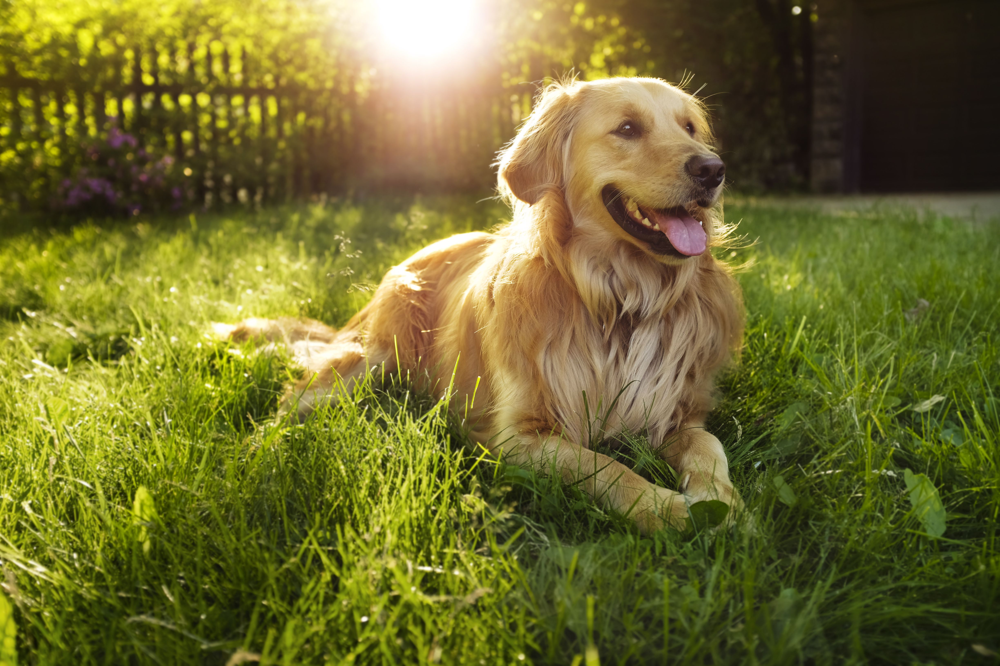

In [ ]:
img1

In [ ]:
import gradio
import gradio as gr


#setup the interface
iface = gr.Interface(
    fn = t5_summarize, 
    inputs = 'textbox', 
    outputs = [gradio.outputs.Textbox(), gradio.outputs.Image()]
)
iface.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`


2022-01-20 18:33:24.589 INFO    paramiko.transport: Connected (version 2.0, client OpenSSH_7.6p1)
2022-01-20 18:33:24.927 INFO    paramiko.transport: Authentication (publickey) successful!


Running on public URL: https://34004.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<Flask 'gradio.networking'>,
 'http://127.0.0.1:7861/',
 'https://34004.gradio.app')